We scanned *a lot* of teeth for the ZMK guys and gals.
Let's generate overview images of them

In [1]:
import platform
import os
import glob
import pandas
import imageio
import numpy
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import seaborn
import dask
import dask_image.imread
from distributed import Client
client = Client()
# Then go to http://localhost:8787/status
from numcodecs import Blosc
from tqdm import notebook
import skimage.filters
import skimage.morphology
import skimage.segmentation
import scipy.ndimage

In [2]:
print('You can seee what DASK is doing at "http://localhost:%s/status"' % client.scheduler_info()['services']['dashboard'])

You can seee what DASK is doing at "http://localhost:8787/status"


In [3]:
# https://stackoverflow.com/a/62242245/323100
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Set up figure defaults
plt.rc('image', cmap='gray', interpolation='nearest')  # Display all images in b&w and with 'nearest' interpolation
plt.rcParams['figure.figsize'] = (16, 9)  # Size up figures a bit

In [5]:
# Setup scale bar defaults
plt.rcParams['scalebar.location'] = 'lower right'
plt.rcParams['scalebar.frameon'] = False
plt.rcParams['scalebar.color'] = 'white'

In [605]:
# Display all plots identically
lines = 5
# And then do something like
# plt.subplot(lines, numpy.ceil(len(Data) / float(lines)), c + 1)

In [1269]:
# Different locations if running either on Linux or Windows
FastSSD = False
# to speed things up significantly
if 'Linux' in platform.system():
    if FastSSD:
        BasePath = os.path.join(os.sep, 'media', 'habi', 'Fast_SSD')
    else:
        BasePath = os.path.join(os.sep, 'home', 'habi', '1272')
else:
    if FastSSD:
        BasePath = os.path.join('F:\\')
    else:
        if 'anaklin' in platform.node():
            BasePath = os.path.join('S:\\')
        else:
            BasePath = os.path.join('D:\\Results')
Root = os.path.join(BasePath, 'ZMK')
print('We are loading all the data from %s' % Root)

We are loading all the data from D:\Results\ZMK


In [1270]:
if 'Linux' in platform.system():
    tmp = os.path.join(os.sep, 'media', 'habi', 'Fast_SSD')
else:
    if 'anaklin' in platform.node():
        tmp = os.path.join('F:\\')
    else:
        tmp = os.path.join('D:\\')
dask.config.set({'temporary_directory': os.path.join(tmp, 'tmp')})

In [1271]:
# Make us a dataframe for saving all that we need
Data = pandas.DataFrame()

In [1272]:
# Look only for folders: https://stackoverflow.com/a/38216530
Data['Folder'] = glob.glob(os.path.join(Root, 'ToothBattallion', '*' + os.path.sep))

In [1273]:
print('We found %s tooth folders in %s' % (len(Data), Root))

We found 76 tooth folders in D:\Results\ZMK


In [1274]:
# We could do it in a list comprehension, but then it fails if we're still scanning a tooth
# Data['LogFile'] = [sorted(glob.glob(os.path.join(f, '*.log')))[0] for f in Data['Folder']]
for c, row in Data.iterrows():
    try:
        Data.at[c,'LogFile'] = sorted(glob.glob(os.path.join(row['Folder'], '*.log')))[0]
    except IndexError:
        print('No logfile found in %s, removing the folder temporarily' % row.Folder)
        Data.at[c,'LogFile'] = 'scanning'
Data = Data[Data['LogFile'] != 'scanning']
Data.reset_index(drop=True, inplace=True)
print('We have %s tooth folders to work with' % (len(Data)))

We have 76 tooth folders to work with


In [1275]:
Data['Sample'] = [os.path.splitext(os.path.basename(l))[0] for l in Data['LogFile']]

In [1276]:
# Proper sorting *with* leading zeros :)
Data.sort_values(by=['Sample'], inplace=True)

In [1277]:
# Get the file names of the reconstructions
Data['Reconstructions'] = [sorted(glob.glob(os.path.join(f,
                                                         'rec',
                                                         '*rec*.png'))) for f in Data['Folder']]
Data['Number of reconstructions'] = [len(r) for r in Data.Reconstructions]

In [1278]:
# Drop samples which have not been reconstructed yet
# Based on https://stackoverflow.com/a/13851602
for sample in Data[Data['Number of reconstructions'] == 0]['Sample']:
    print('%s has not been reconstructed yet, we remove it from our data temporarily' % sample)
Data = Data[Data['Number of reconstructions'] > 0]
Data.reset_index(drop=True, inplace=True)
print('We have %s tooth folders with reconstructions' % (len(Data)))

Tooth032 has not been reconstructed yet, we remove it from our data temporarily
Tooth034 has not been reconstructed yet, we remove it from our data temporarily
Tooth071 has not been reconstructed yet, we remove it from our data temporarily
Tooth072 has not been reconstructed yet, we remove it from our data temporarily
Tooth073 has not been reconstructed yet, we remove it from our data temporarily
Tooth074 has not been reconstructed yet, we remove it from our data temporarily
Tooth075 has not been reconstructed yet, we remove it from our data temporarily
Tooth076~00 has not been reconstructed yet, we remove it from our data temporarily
We have 68 tooth folders with reconstructions


In [1279]:
def get_pixelsize(logfile):
    """Get the pixel size from the scan log file"""
    with open(logfile, 'r') as f:
        for line in f:
            if 'Image Pixel' in line and 'Scaled' not in line:
                pixelsize = float(line.split('=')[1])
    return(pixelsize)

In [1280]:
Data['Voxelsize'] = [get_pixelsize(log) for log in Data['LogFile']]

In [1281]:
# Check voxel sizes (*rounded* to two after-comma values)
# If different, spit out which values
if len(Data['Voxelsize'].round(2).unique())>1:
    print('We scanned the tooths with %s different voxel sizes' % len(Data['Voxelsize'].round(2).unique()))
    for vs in sorted(Data['Voxelsize'].round(2).unique()):
        print('-', vs, 'um for Samples ', end='')
        for c, row in Data.iterrows():
            if float(vs) == round(row['Voxelsize'],2):
                print(row.Sample, end=', ')
        print('')
else:
    print('We scanned all datasets with equal voxel size, namely %s.' % Data['Voxelsize'].unique()[0])

We scanned the tooths with 3 different voxel sizes
- 7.33 um for Samples Tooth003, 
- 8.56 um for Samples Tooth001, Tooth002, 
- 10.0 um for Samples Tooth004, Tooth005, Tooth006, Tooth007, Tooth008, Tooth009, Tooth010, Tooth011, Tooth012, Tooth013, Tooth014, Tooth015, Tooth016, Tooth017, Tooth018, Tooth019, Tooth020, Tooth021, Tooth022, Tooth023, Tooth024, Tooth025, Tooth026, Tooth027, Tooth028, Tooth029, Tooth030, Tooth031, Tooth033, Tooth035, Tooth036, Tooth037, Tooth038, Tooth039, Tooth040, Tooth041, Tooth042, Tooth043, Tooth044, Tooth045, Tooth046, Tooth047, Tooth048, Tooth049, Tooth050, Tooth051, Tooth052, Tooth053, Tooth054, Tooth055, Tooth056, Tooth057, Tooth058, Tooth059, Tooth060, Tooth061, Tooth062, Tooth063, Tooth064, Tooth065, Tooth066, Tooth067, Tooth068, Tooth069, Tooth070, 


In [1282]:
def get_reconstruction_grayvalue(logfile):
    """How did we map the brightness of the reconstructions?"""
    with open(logfile, 'r') as f:
        for line in f:
            if 'Maximum for' in line:
                grayvalue = float(line.split('=')[1])
    return(grayvalue)

In [1283]:
def get_stacks(logfile):
    """How many stacks/connected scans did we make?"""
    with open(logfile, 'r') as f:
        for line in f:
            if 'conn' in line:
                stacks = int(line.split('=')[1])
    return(stacks)

In [1284]:
Data['Stacks'] = [get_stacks(log) for log in Data['LogFile']]

In [1285]:
def get_scantime(logfile):
    """How long did we scan?"""
    with open(logfile, 'r') as f:
        for line in f:
            if 'Scan duration' in line:
                time = line.split('=')[1]
    return(time)

In [1286]:
Data['Scan time'] = [get_scantime(log) for log in Data['LogFile']]

In [1287]:
def get_numproj(logfile):
    """How many projections did we record?"""
    with open(logfile, 'r') as f:
        for line in f:
            if 'Number' in line and 'Files' in line:
                numproj = int(line.split('=')[1])
    return(numproj)

In [1288]:
Data['Number of Projections'] = [get_numproj(log) for log in Data['LogFile']]

In [1289]:
Data['Number of Projections'].unique()

array([319, 477, 322, 482], dtype=int64)

In [1290]:
Data.head()

,Folder,LogFile,Sample,Reconstructions,Number of reconstructions,Voxelsize,Stacks,Scan time,Number of Projections
0,D:\Results\ZMK\ToothBattallion\1\,D:\Results\ZMK\ToothBattallion\1\Tooth001.log,Tooth001,[D:\Results\ZMK\ToothBattallion\1\rec\Tooth001...,2028,8.559493,5,0h:26m:29s\n,319
1,D:\Results\ZMK\ToothBattallion\2\,D:\Results\ZMK\ToothBattallion\2\Tooth002.log,Tooth002,[D:\Results\ZMK\ToothBattallion\2\rec\Tooth002...,3105,8.559809,6,0h:32m:5s\n,477
2,D:\Results\ZMK\ToothBattallion\3\,D:\Results\ZMK\ToothBattallion\3\Tooth003.log,Tooth003,[D:\Results\ZMK\ToothBattallion\3\rec\Tooth003...,4006,7.327053,6,0h:32m:5s\n,477
3,D:\Results\ZMK\ToothBattallion\4\,D:\Results\ZMK\ToothBattallion\4\Tooth004.log,Tooth004,[D:\Results\ZMK\ToothBattallion\4\rec\Tooth004...,2890,9.999986,5,0h:26m:49s\n,322
4,D:\Results\ZMK\ToothBattallion\5\,D:\Results\ZMK\ToothBattallion\5\Tooth005.log,Tooth005,[D:\Results\ZMK\ToothBattallion\5\rec\Tooth005...,2772,9.999986,5,0h:40m:31s\n,482


In [1291]:
CHECK Overlap

SyntaxError: invalid syntax (<ipython-input-1291-38d9b7af85b6>, line 1)

In [1292]:
CHECK NUMPROJ

SyntaxError: invalid syntax (<ipython-input-1292-7408ff39141f>, line 1)

In [1293]:
Data['Grayvalue'] = [get_reconstruction_grayvalue(log) for log in Data['LogFile']]

In [1294]:
if len(Data['Grayvalue'].unique())>1:
    print('We reconstructed the datasets with different maximum gray values, namely')
    for gv in Data['Grayvalue'].unique():
        print(gv, 'for Samples ', end='')
        for c,row in Data.iterrows():
            if float(gv) == row['Grayvalue']:
                print(row.Sample, end=', ')
        print('')
else:
    print('We reconstructed all datasets with equal maximum gray value, namely %s.' % Data['Grayvalue'].unique()[0])

We reconstructed all datasets with equal maximum gray value, namely 0.18.


In [1295]:
Data.LogFile[0]

'D:\\Results\\ZMK\\ToothBattallion\\1\\Tooth001.log'

In [1296]:
Data['PreviewImagePath'] = [sorted(glob.glob(os.path.join(f, 'rec', '*.bmp'))) for f in Data['Folder']]
Data['PreviewImage'] = [imageio.imread(pip[0])
                        if pip
                        else numpy.random.random((100,100)) for pip in Data['PreviewImagePath']]

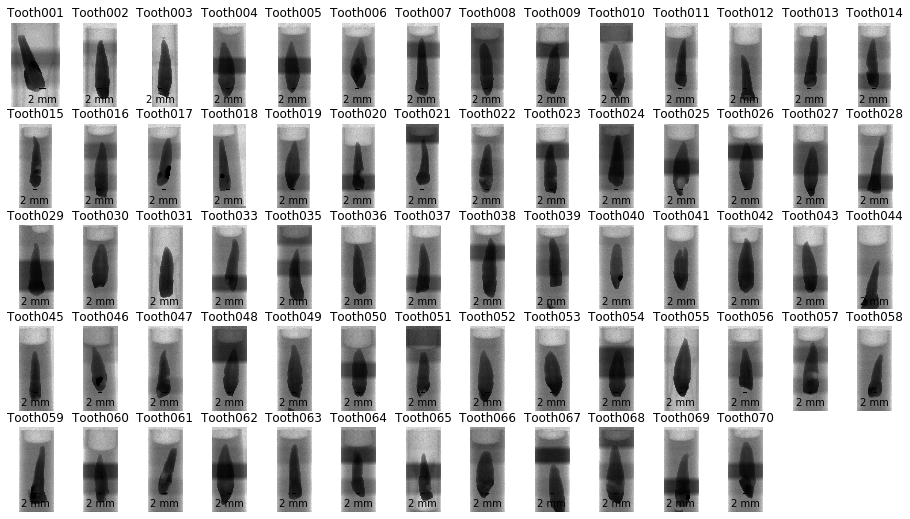

In [1297]:
for c,row in Data.iterrows():
    plt.subplot(lines, numpy.ceil(len(Data) / float(lines)), c + 1)
    plt.imshow(row.PreviewImage)
    plt.title(row.Sample)
    plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um', color='black'))
    plt.axis('off')
plt.show()

In [ ]:
# Convert all reconstructions into a DASK array and save them to disk
# Partially based on http://stackoverflow.com/a/39195332/323100
# and on /LungMetastasis/HighResolutionScanAnalysis.ipynb
Data['OutputNameRec'] = [os.path.join(f, sample + '_rec.zarr') for f, sample in zip(Data.Folder, Data.Sample)]
for c, row in notebook.tqdm(Data.iterrows(),
                            desc='Converting reconstructions to .zarr',
                            total=len(Data)):
    if not os.path.exists(row['OutputNameRec']):
        print('%2s/%s: Reading %s reconstructions and saving to %s' % (c + 1,
                                                                       len(Data),
                                                                       row['Number of reconstructions'],
                                                                       row['OutputNameRec'][len(Root):]))
        Reconstructions = dask_image.imread.imread(os.path.join(row['Folder'], 'rec', '*rec*.png'))
        Reconstructions.to_zarr(row['OutputNameRec'],
                                overwrite=True,
                                compressor=Blosc(cname='zstd',
                                                 clevel=3,
                                                 shuffle=Blosc.BITSHUFFLE))

40/68: Reading 2748 reconstructions and saving to \ToothBattallion\42\Tooth042_rec.zarr
65/68: Reading 2472 reconstructions and saving to \ToothBattallion\67\Tooth067_rec.zarr


In [ ]:
# for file in Data['OutputNameRec']:
#     print(file)
#     dask.array.from_zarr(file)

In [ ]:
# Load the reconstructions a zarr arrays
Reconstructions = [dask.array.from_zarr(file) for file in Data['OutputNameRec']]

In [ ]:
# How big are the datasets?
Data['Size'] = [rec.shape for rec in Reconstructions]

In [ ]:
# The three cardinal directions
directions = ['Axial', 'Sagittal', 'Coronal']

In [ ]:
# Read or calculate the middle slices, put them into the dataframe and save them to disk
for d, direction in enumerate(directions):
    Data['Mid_' + direction] = [None] * len(Reconstructions)
for c, row in notebook.tqdm(Data.iterrows(), desc='Middle images', total=len(Data)):
    for d, direction in notebook.tqdm(enumerate(directions),
                                      desc=row['Sample'],
                                      leave=False,
                                      total=len(directions)):
        outfilepath = os.path.join(row['Folder'], '%s.Middle.%s.png' % (row['Sample'], direction))
        if os.path.exists(outfilepath):
            Data.at[c,'Mid_' + direction] = imageio.imread(outfilepath)
        else:
            # Generate requested axial view
            if 'Axial' in direction:
                Data.at[c,'Mid_' + direction] = Reconstructions[c][Data['Size'][c][0]//2].compute()
            if 'Sagittal' in direction:
                Data.at[c,'Mid_' + direction] = Reconstructions[c][:,Data['Size'][c][1]//2,:].compute()
            if 'Coronal' in direction:
                Data.at[c,'Mid_' + direction] = Reconstructions[c][:,:,Data['Size'][c][2]//2].compute()
            # Save the calculated 'direction' view to disk
            imageio.imwrite(outfilepath, (Data.at[c,'Mid_' + direction]))

In [ ]:
# # Show middle slices
# for c, row in Data.iterrows():
#     for d, direction in enumerate(directions):
#         plt.subplot(1, 3, d + 1)
#         plt.imshow(row['Mid_' + direction])
#         if d==0:
#             plt.axhline(row.Size[1]//2, c=seaborn.color_palette()[0])
#             plt.axvline(row.Size[2]//2, c=seaborn.color_palette()[1])
#             plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um', color=seaborn.color_palette()[2]))
#         elif d==1:
#             plt.axhline(row.Size[0]//2, c=seaborn.color_palette()[2])
#             plt.axvline(row.Size[d]//2, c=seaborn.color_palette()[1])
#             plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um', color=seaborn.color_palette()[0]))
#         else:
#             plt.axhline(row.Size[0]//2, c=seaborn.color_palette()[2])
#             plt.axvline(row.Size[d]//2, c=seaborn.color_palette()[0])
#             plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um', color=seaborn.color_palette()[1]))
#         plt.title('%s/%s: %s, %s' % (c + 1,
#                                      len(Data),
#                                      row['Sample'],
#                                      direction + ' Middle slice'))
#         plt.axis('off')
#     plt.savefig(os.path.join(row['Folder'], row['Sample'] + '.MiddleSlices.png'),
#                 bbox_inches='tight')
#     plt.show()

In [ ]:
# Read or calculate the directional MIPs, put them into the dataframe and save them to disk
for d, direction in enumerate(directions):
    Data['MIP_' + direction] = [None] * len(Reconstructions)
for c, row in notebook.tqdm(Data.iterrows(), desc='MIPs', total=len(Data)):
    for d, direction in notebook.tqdm(enumerate(directions),
                                      desc=row['Sample'],
                                      leave=False,
                                      total=len(directions)):
        outfilepath = os.path.join(row['Folder'], '%s.MIP.%s.png' % (row['Sample'], direction))
        if os.path.exists(outfilepath):
            Data.at[c,'MIP_' + direction] = imageio.imread(outfilepath)
        else:
            # Generate MIP
            Data.at[c,'MIP_' + direction] = Reconstructions[c].max(axis=d).compute()
            # Save it out
            imageio.imwrite(outfilepath, Data.at[c,'MIP_' + direction].astype('uint8'))

In [ ]:
# Show MIP slices
for c, row in Data.iterrows():
    for d, direction in enumerate(directions):
        plt.subplot(1, 3, d + 1)
        plt.imshow(row['MIP_' + direction])
        plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um'))
        plt.title('%s/%s: %s, %s' % (c + 1,
                                     len(Data),
                                     row['Sample'],
                                     direction + ' MIP'))
        plt.axis('off')
    plt.savefig(os.path.join(row['Folder'], row['Sample'] + '.MIPs.png'),
                bbox_inches='tight')
    plt.show()

The cropping of the tooth datasets is based on 'Vessels' notebook from Ludovics Mellys Heart project

In [ ]:
# Threshold the MIPs, so we can cut down the datasets to their minimum
# Read or calculate the directional MIPs, put them into the dataframe and save them to disk
for d, direction in enumerate(directions):
    Data['MIP_Threshold_' + direction] = [None] * len(Data)
    Data['MIP_Thresholded_' + direction] = [None] * len(Data)
for c, row in notebook.tqdm(Data.iterrows(), desc='MIPs', total=len(Data)):
    for d, direction in notebook.tqdm(enumerate(directions),
                                      desc=row['Sample'],
                                      leave=False,
                                      total=len(directions)):
        outfilepath = os.path.join(row['Folder'], '%s.MIP.Thresholded.%s.png' % (row['Sample'], direction))
        if os.path.exists(outfilepath):
            Data.at[c,'MIP_Thresholded_' + direction] = imageio.imread(outfilepath)
        else:
            # Calculate MIP threshold, then threshold MIP
            Data.at[c, 'MIP_Threshold_' + direction] = skimage.filters.threshold_otsu(row['MIP_' + direction].ravel())
            # Threshold the MIP with their Otsu threshold
            Data.at[c, 'MIP_Thresholded_' + direction] = row['MIP_' + direction] > skimage.filters.threshold_otsu(row['MIP_' + direction])
            # Save it out
            Data.at[c,'MIP_Thresholded_' + direction]
            imageio.imwrite(outfilepath,
                            (Data.at[c,'MIP_Thresholded_' + direction].astype('uint8') * 255))

In [ ]:
# We remove speckles from the thresholded MIPs and crop based on the largest object there, 
# based on https://stackoverflow.com/a/34731073/323100
for d, direction in enumerate(directions):
    Data['MIP_Thresholded_Cleaned_' + direction] = [None] * len(Data)
for c, row in notebook.tqdm(Data.iterrows(), desc='MIPs', total=len(Data)):
    for d, direction in notebook.tqdm(enumerate(directions),
                                      desc=row['Sample'],
                                      leave=False,
                                      total=len(directions)):
        outfilepath = os.path.join(row['Folder'], '%s.MIP.Thresholded.Cleaned.%s.png' % (row['Sample'], direction))
        if os.path.exists(outfilepath):
            Data.at[c,'MIP_Thresholded_Cleaned_' + direction] = imageio.imread(outfilepath)
        else:
            Data.at[c,'MIP_Thresholded_Cleaned_' +
                    direction] = skimage.morphology.remove_small_holes(row['MIP_Thresholded_' + direction]==False,
                                                                       area_threshold=1e3)==False
            # Save it out
            imageio.imwrite(outfilepath,
                            (Data.at[c,'MIP_Thresholded_Cleaned_' + direction].astype('uint8') * 255))        

In [ ]:
for d, direction in enumerate(directions):
    Data['CropStartV' + direction] = [None] * len(Data)
    Data['CropStopV' + direction] = [None] * len(Data)
    Data['CropStartH' + direction] = [None] * len(Data)
    Data['CropStopH' + direction] = [None] * len(Data)
for c, row in Data.iterrows():
#     print(row.Sample)
    for direction in directions:
        # Example 2 on https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.find_objects.html
        crop = scipy.ndimage.find_objects(row['MIP_Thresholded_Cleaned_' + direction].astype('bool'))[0]
        Data.at[c,'CropStartV' + direction] = crop[0].start
        Data.at[c,'CropStopV' + direction] = crop[0].stop
        Data.at[c,'CropStartH' + direction] = crop[1].start
        Data.at[c,'CropStopH' + direction] = crop[1].stop

In [ ]:
# Show the cleaned thresholded MIPs with the crop regions
for d,direction in enumerate(directions):
    for c,row in Data.iterrows():
        plt.subplot(lines, numpy.ceil(len(Data) / float(lines)), c + 1)
        plt.imshow(row['MIP_' + direction])
        plt.imshow(row['MIP_Thresholded_' + direction], alpha=0.6)
        plt.imshow(numpy.ma.masked_equal(row['MIP_Thresholded_Cleaned_' + direction], 0), cmap='viridis', alpha=0.3)
        plt.axhline(row['CropStartV' + direction])
        plt.axhline(row['CropStopV' + direction])
        plt.axvline(row['CropStartH' + direction])
        plt.axvline(row['CropStopH' + direction])
        plt.title('%s\nCleaned %s MIP' % (row['Sample'], direction))
        plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um'))
        plt.axis('off')
    plt.show()

In [ ]:
# Apply the crop-values now!
CroppedReconstructions = [None] * len(Data)
border = 5
for c,row in Data.iterrows():
    CroppedReconstructions[c] = Reconstructions[c][row['CropStartVCoronal']-border:row['CropStopVCoronal']+border,
                                                   row['CropStartVAxial']-border:row['CropStopVAxial']+border,
                                                   row['CropStartHSagittal']-border:row['CropStopHSagittal']+border]

In [ ]:
# Save out the cropped reconstructions
Data['OutputNameRecCrop'] = [os.path.join(f, sample + '_rec_crop.zarr') for f, sample in zip(Data.Folder, Data.Sample)]
for c, row in notebook.tqdm(Data.iterrows(), desc='Saving cropped .zarr files', total=len(Data)):
    if not os.path.exists(row['OutputNameRecCrop']):
        print('%2s/%s: Saving to %s' % (c + 1,
                                        len(Data), 
                                        row['OutputNameRecCrop'][len(Root):]))
        try:
            CroppedReconstructions[c].to_zarr(row['OutputNameRecCrop'],
                                              overwrite=True,
                                              compressor=Blosc(cname='zstd', clevel=3, shuffle=Blosc.BITSHUFFLE)) 
        except ZeroDivisionError:
            print(80*'-')
            print('Something went wrong here!')
            print('I think it could be that the tooth slipped down in the holder!')
            print('You should probably delete %s' % row['OutputNameRecCrop'][len(Root):])
            print(80*'-')            

In [ ]:
# for file in Data['OutputNameRecCrop']:
#     print(file)
#     dask.array.from_zarr(file)

In [ ]:
# Load the cropped zarr arrays back in as *reconstructions*
Reconstructions = [dask.array.from_zarr(file) for file in Data['OutputNameRecCrop']]

In [ ]:
# Update the size
Data['Size'] = [rec.shape for rec in Reconstructions]

In [ ]:
# # Save out cropped recs
# for c, row in Data.iterrows():
#     os.makedirs(os.path.join(row.Folder, 'rec_crop'),
#                 exist_ok=True)
#     for d, rec in notebook.tqdm(enumerate(CroppedReconstructions[c]),
#                                 total=len(CroppedReconstructions[c])):
#         filename = os.path.join(row.Folder,
#                                 'rec_crop', str(row.Sample) + 'rec_crop_%08d.png' % d)
#         if not os.path.exists(filename):
#             imageio.imsave(filename, rec)

In [ ]:
# Read or calculate the directional MIPs of the cropped reconstructions
# Put them into the dataframe and save them to disk
for d, direction in enumerate(directions):
    Data['MIP_' + direction] = [None] * len(Data)
for c, row in notebook.tqdm(Data.iterrows(), desc='MIPs', total=len(Data)):
    for d, direction in notebook.tqdm(enumerate(directions),
                                      desc=row['Sample'],
                                      leave=False,
                                      total=len(directions)):
        outfilepath = os.path.join(row['Folder'], '%s.MIP.Crop.%s.png' % (row['Sample'], direction))
        if os.path.exists(outfilepath):
            Data.at[c,'MIP_' + direction] = imageio.imread(outfilepath)
        else:
            try:
                # Generate MIP
                Data.at[c,'MIP_' + direction] = Reconstructions[c].max(axis=d).compute()
                # Save it out
                imageio.imwrite(outfilepath, Data.at[c,'MIP_' + direction].astype('uint8'))
            except ZeroDivisionError:
                print('Something does not work for %s' % row['Sample'])

In [ ]:
# Show MIP slices
for c, row in Data.iterrows():
    for d, direction in enumerate(directions):
        plt.subplot(1, 3, d + 1)
        plt.imshow(row['MIP_' + direction])
        plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um'))
        plt.title('%s/%s: %s, %s' % (c + 1,
                                     len(Data),
                                     row['Sample'],
                                     direction + ' MIP'))
#         plt.axis('off')
    plt.savefig(os.path.join(row['Folder'], row['Sample'] + '.MIPs.Crop.png'),
                bbox_inches='tight')
    plt.show()

In [ ]:
def partialpart(reconstruction, slicenumber, numberofslicesaround=50):
    '''function to get a small MIP around the selected slice number'''
    part = numpy.min(reconstruction[slicenumber-numberofslicesaround//2:slicenumber+numberofslicesaround//2],
                     axis=0)
    return(part)

In [ ]:
def get_minimum(curve, verbose=False):
    '''
    Function to detect get the border of enamel/dentin.
    We do this by detecting the minimum of the derivative of the smoothed grayvalue curve
    Based on https://stackoverflow.com/a/28541805/323100 and some manual tweaking
    '''
    from statsmodels.nonparametric.smoothers_lowess import lowess
    smoothed=lowess(curve, range(len(curve)), return_sorted=False, frac=0.025)
    minima=numpy.argmin(numpy.diff(smoothed))
    if verbose:
        plt.plot(curve, alpha=0.6, label='Input curve')
        plt.plot(smoothed, label='LOWESS')
        plt.axvline(minima, label='Border')
        plt.legend()
    return(minima)

In [ ]:
def splitter(whichone, top=0, max=True, verbose=False):
    '''
    According to the discussion on July 6 with Thomas & Andrea, the characterization of the pulpa is done at three levels.
    The start of the levels is at the border enamel/dentin.
    With a bit of filtering of the gray values of the MIPs along the tooth we find this border and then return three images in this region.
    We save the figure and return the four images.
    '''
    # First we need to detect the border.
    # We do this by smoothing the gray value along the tooth, calculating the difference along the axis and taking its minimum
    # This should be the border between enamel/dentin
    grayvalues = Data.MIP_Sagittal[whichone].max(axis=1)    
    if top < 1:
        top = get_minimum(grayvalues, verbose)
    # Since we don't want the *very* bottom, we 'fake' slices extraction by generating the range,
    # splitting it in three, selecting the start of each split as slices and add a slice not at the very bottom
    slices = range(top, Reconstructions[whichone].shape[0])
    split = numpy.array_split(slices,3)
    slices = [s[0] for s in split]
    slices.append(Reconstructions[whichone].shape[0] - 50)
    if verbose:
        print('The scan has %s slices' % Reconstructions[whichone].shape[0])
        print('We found the enamel/dentin border at slice %s' % top)
        print('We split the distance from slice %s to %s in three parts (e.g. %s//3)' % (top,
                                                                                         Reconstructions[whichone].shape[0],
                                                                                         distance))
        print('We are returning slice', end=' ')
        for i in slices[:-1]:
            print(i, end=', ')
        print('and %s for the pulpa characterization' % slices[-1])    
    # Based on https://matplotlib.org/tutorials/intermediate/gridspec.html            
    fig = plt.figure(constrained_layout=True)
    gs = fig.add_gridspec(2, 4)
    fig_mip_s = fig.add_subplot(gs[:,0])
    plt.imshow(Data.MIP_Sagittal[whichone])
    plt.plot(grayvalues / 2**8 * Data.MIP_Sagittal[whichone].shape[1],
             range(Data.MIP_Sagittal[whichone].shape[0]))
    for i in slices:
        plt.axhline(i, c='r')
    plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um'))        
    fig_mip_s.set_title('Sagittal MIP\nSlices and grey value profile')
    fig_mip_c = fig.add_subplot(gs[:,1])
    plt.imshow(Data.MIP_Coronal[whichone])
    plt.plot(grayvalues / 2**8 * Data.MIP_Coronal[whichone].shape[1],
             range(Data.MIP_Coronal[whichone].shape[0]))        
    for i in slices:
        plt.axhline(i, c='r')
    plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um'))        
    fig_mip_c.set_title('Coronal MIP\nSlices and grey value profile')
    for i in range(4):
        if i < 2:
            fig_slc = fig.add_subplot(gs[0, i+2])
        else:
            fig_slc = fig.add_subplot(gs[1, i])
        fig_slc.set_title('Slice %s' % slices[i])    
        plt.imshow(Reconstructions[whichone][slices[i]])
        plt.gca().add_artist(ScaleBar(row['Voxelsize'], 'um'))        
        plt.axis('off')
    if verbose:
        print('Saving figure to %s' % os.path.join(Data.Folder[whichone], Data.Sample[whichone] + 'ExtractedSlices.png'))
    plt.suptitle(Data.Sample[whichone])
    plt.savefig(os.path.join(Data.Folder[whichone], Data.Sample[whichone] + '.ExtractedSlices.png'))
    plt.show()
    slices=[1,2]
    return(Reconstructions[whichone][slices])

In [ ]:
# Doesn't work automatically, so we select the border manually
splitter(15, top=950)

In [ ]:
ERRORCHECKING!

In [ ]:
# Doesn't work automatically, so we select the border manually
splitter(21, top=800)

22


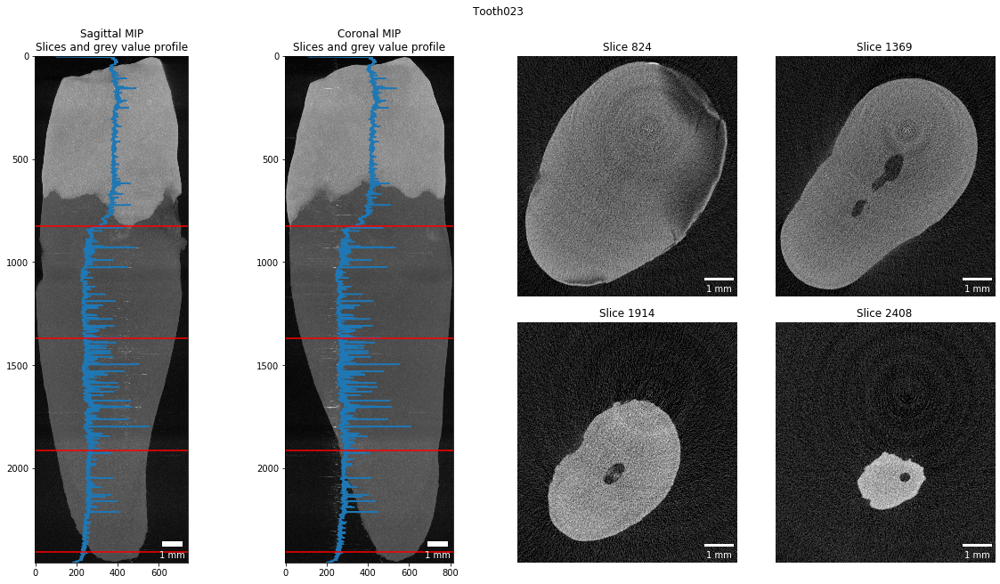

23


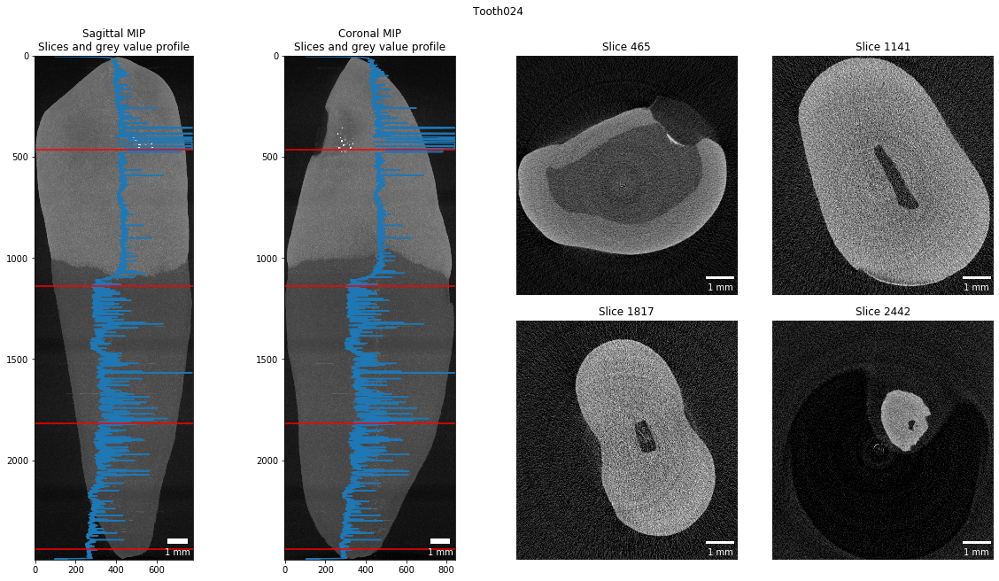

24


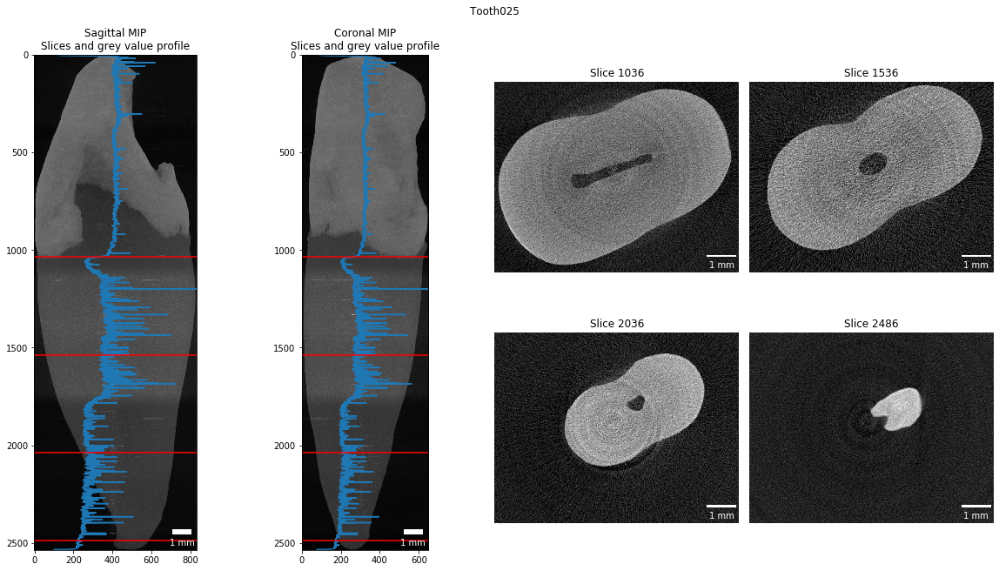

25


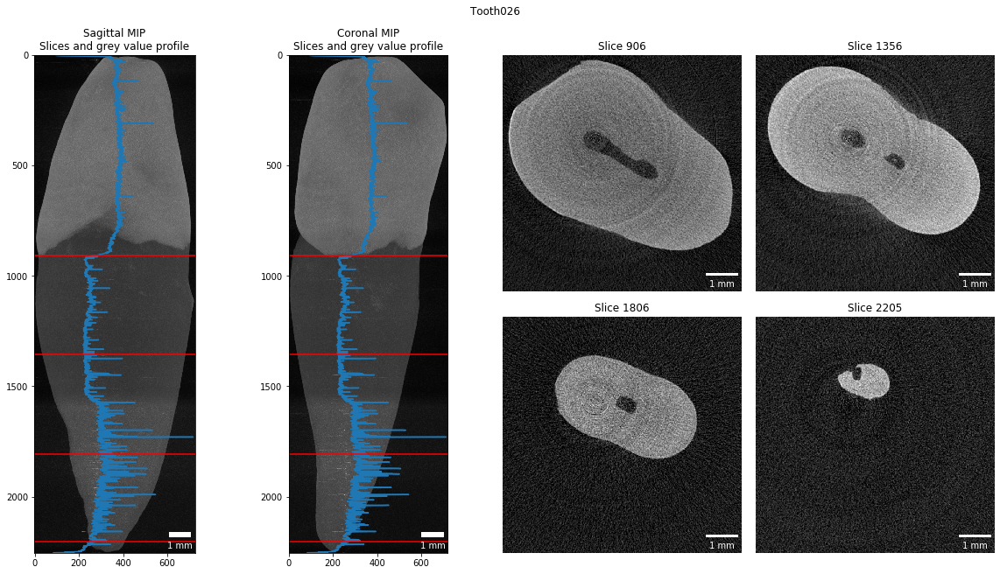

26


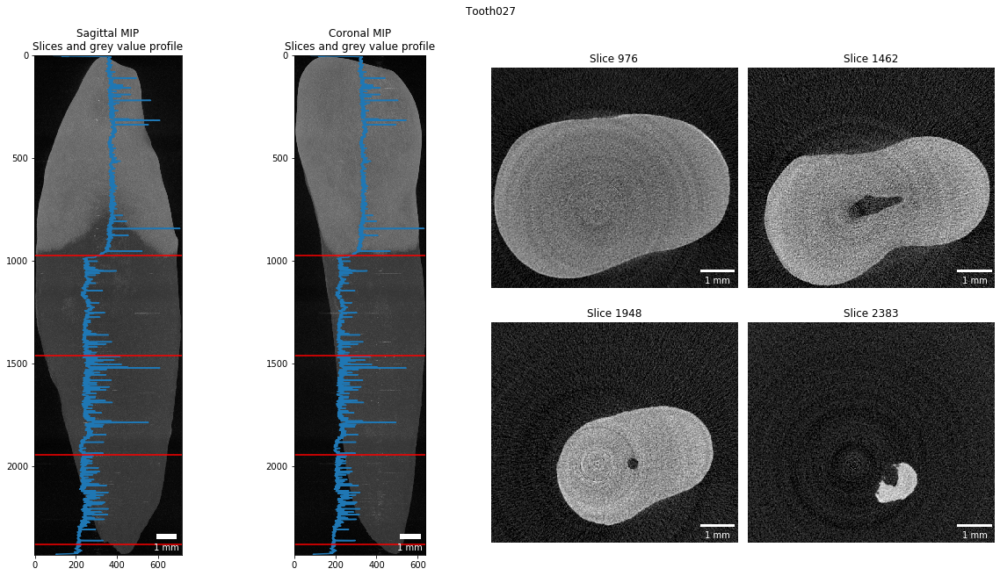

27


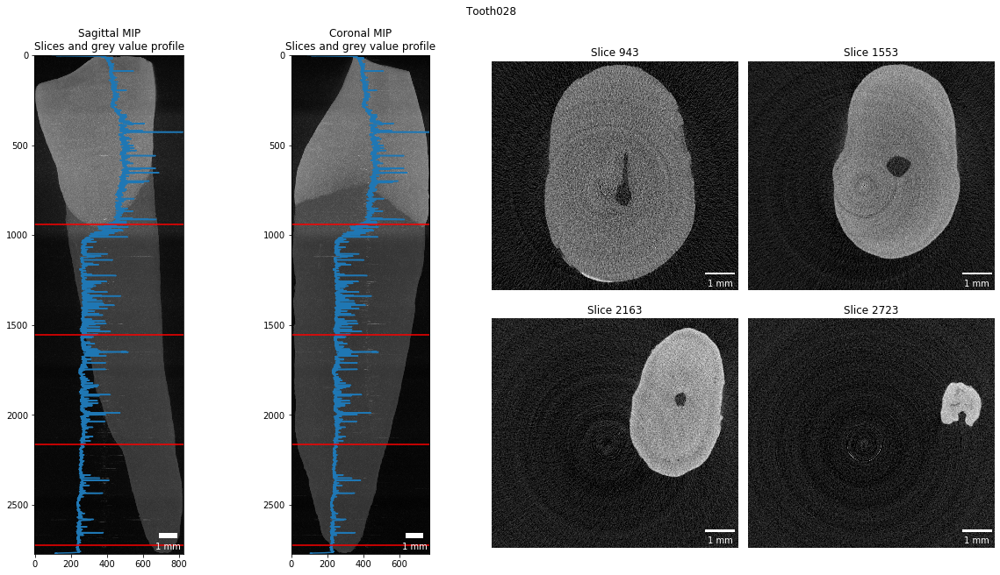

28


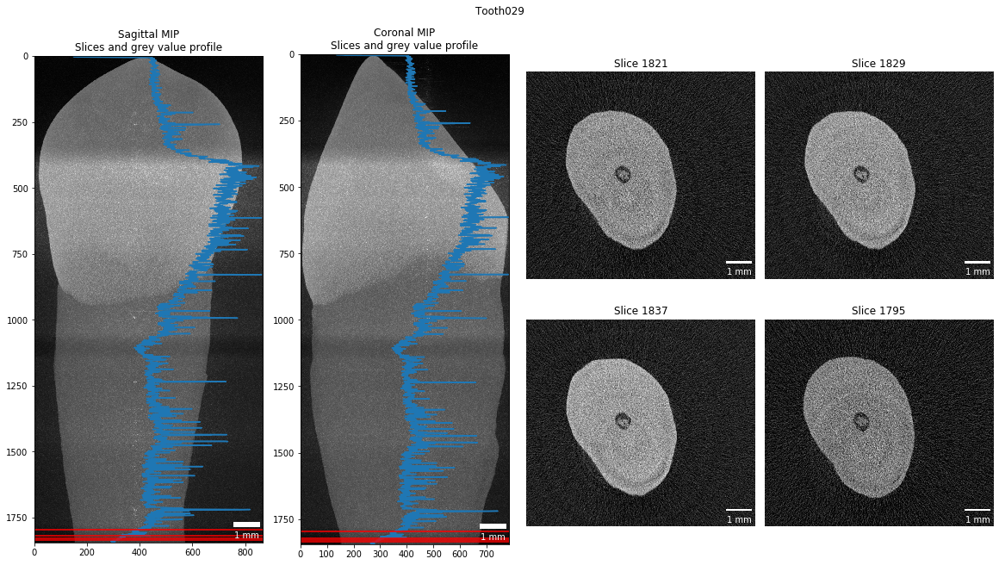

29


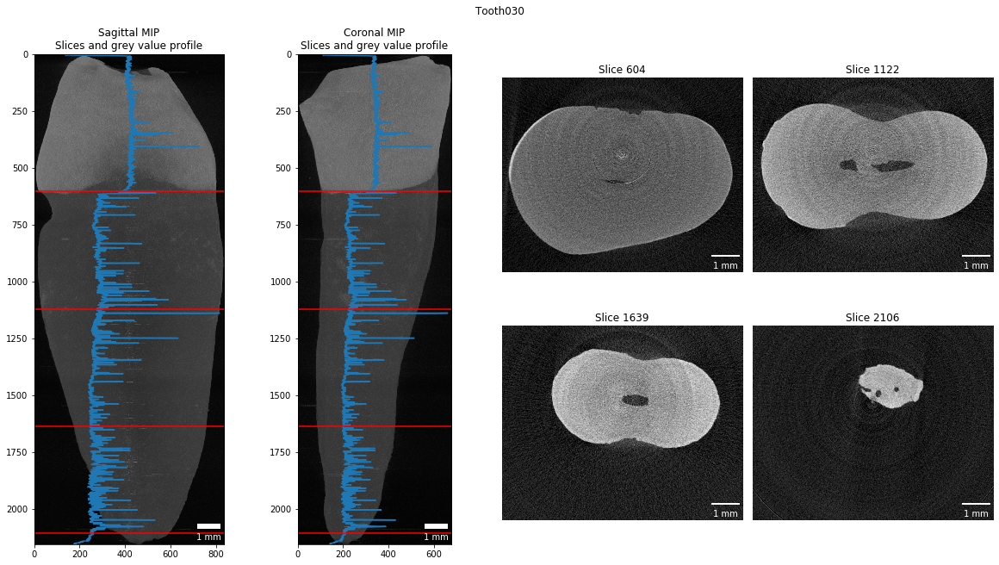

30


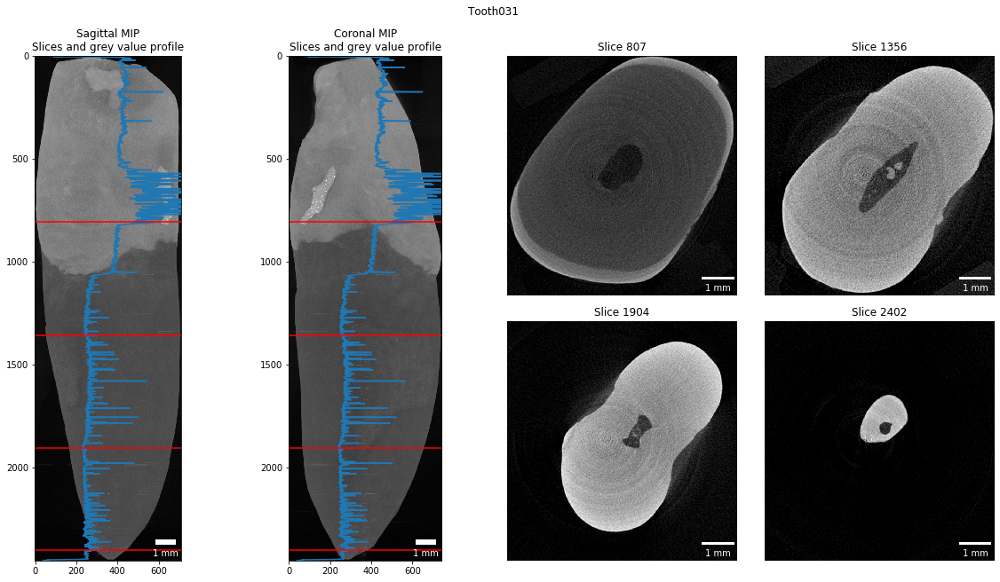

31


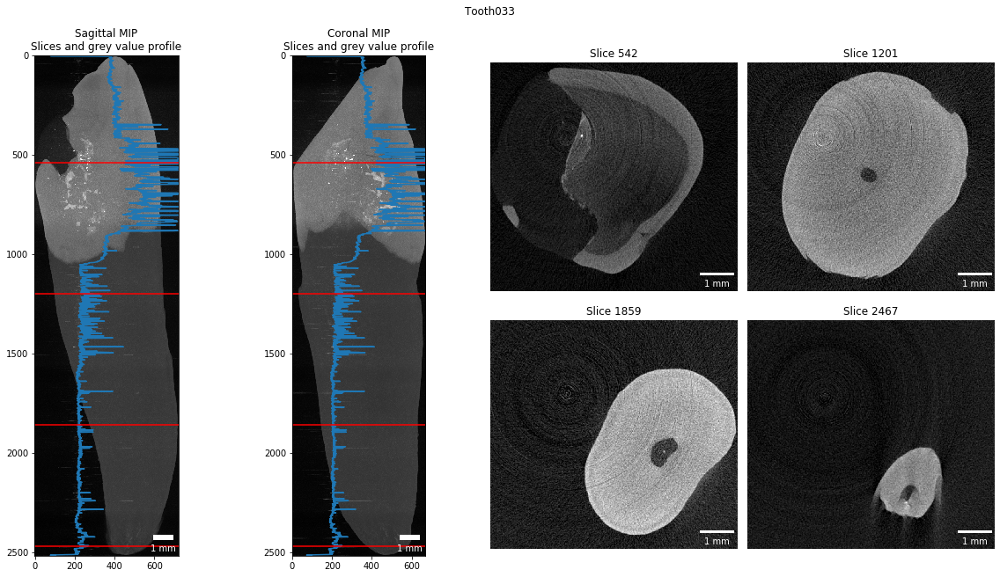

32


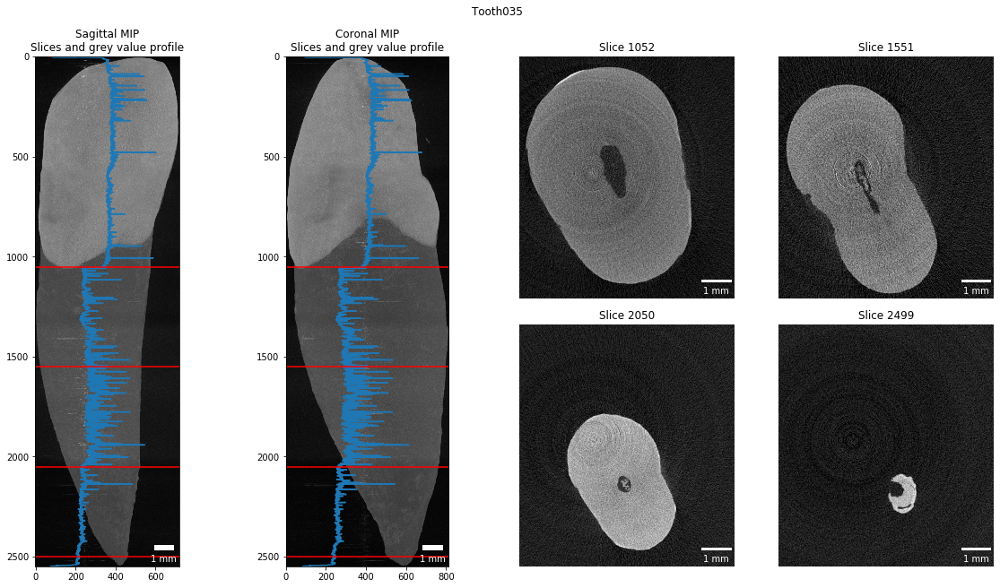

33


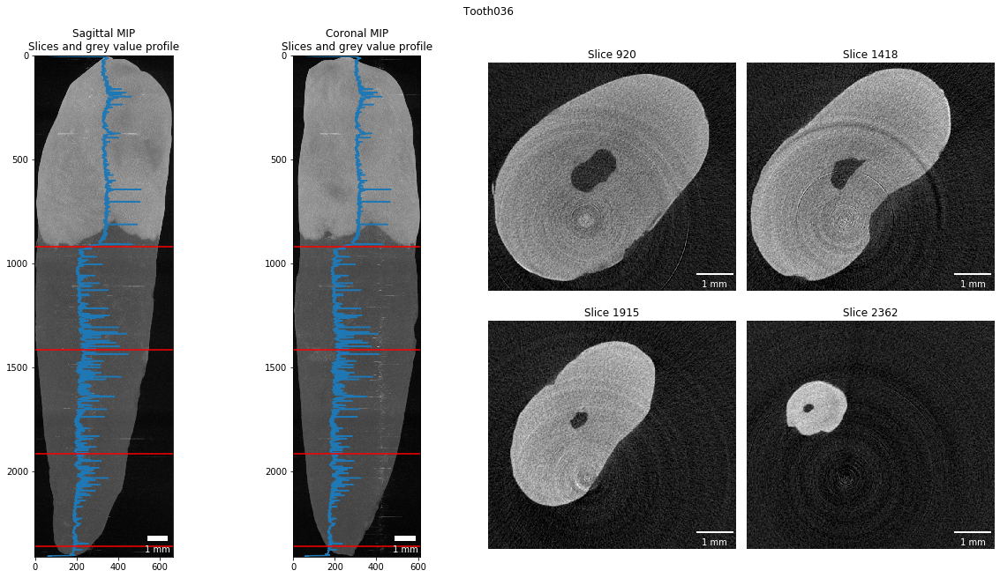

34


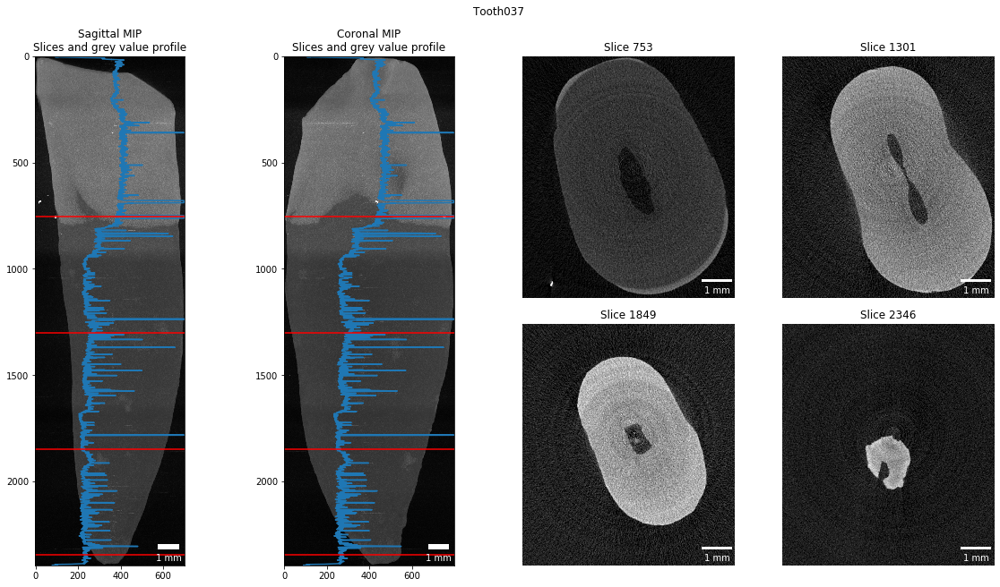

35


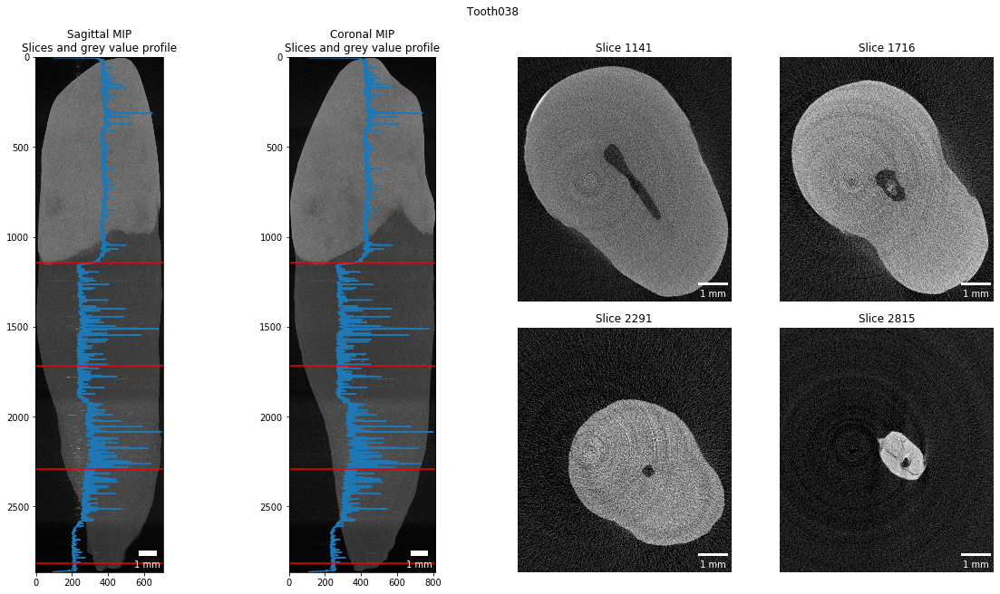

36


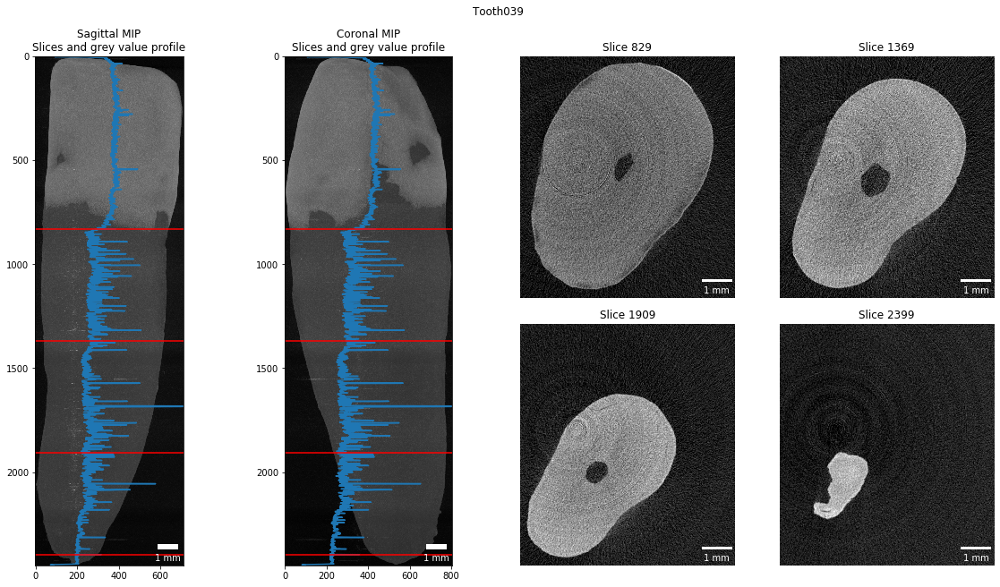

37


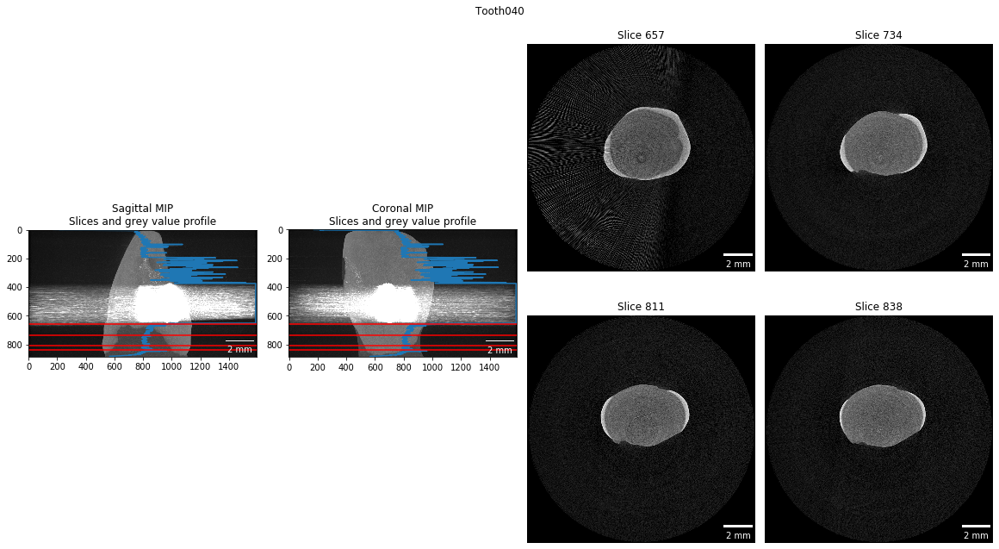

38


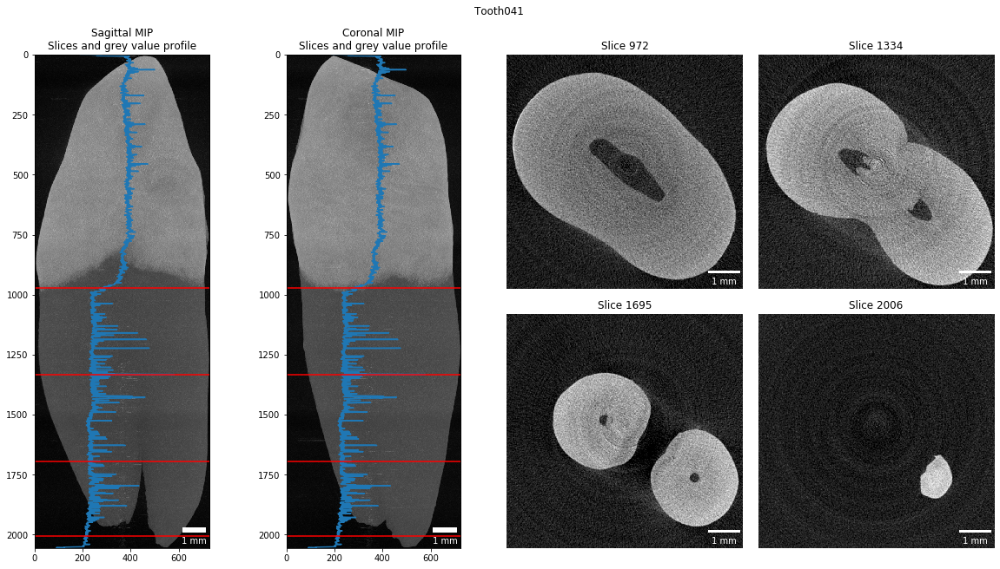

39


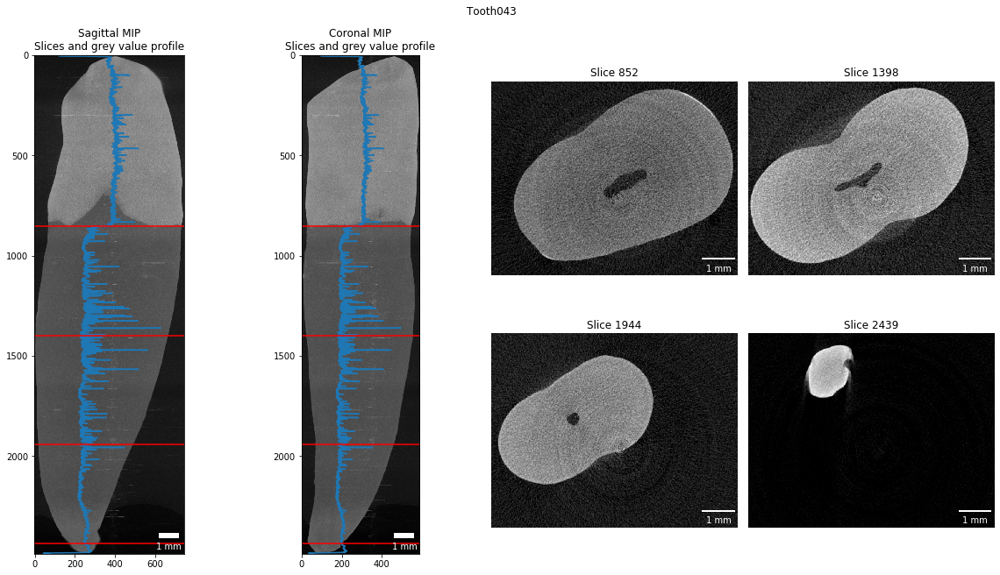

In [1268]:
for i in range(22,40):
    print(i)
    splitter(i, verbose=False)

In [ ]:
def pulponator(image, verbose=False):
    '''Based on holder-removal function from 'HighResolutionScanAnalysis' from fibrosis project'''
    # From dask to 'real' array
    image = image.compute()
    # Threshold image into that the background and pulpa are white
    thresholded = image < skimage.filters.threshold_otsu(image)
    # Remove a all pixels that touch the border to get rid of the background
    stuffinside = skimage.segmentation.clear_border(thresholded, buffer_size=128)
    # Let's close some holes
    closedinsides = skimage.morphology.remove_small_holes(stuffinside, area_threshold=1e4)
    # Get the biggest component: Inspiration from  https://stackoverflow.com/a/47745898/323100
    labels = skimage.measure.label(closedinsides)
    # Get the respective size of the labels
    labelsize = numpy.bincount(labels.flat)
    # Sort them 
    labelsize_sorted = labelsize[labelsize.argsort()]
    try:
        # Select the second-biggest label, the biggest one is the background
        selected_label = labelsize_sorted[-2]
        pulpa = labels == numpy.where(numpy.bincount(labels.flat) == selected_label)
    except IndexError:
        # If we cannot find the second-biggest label, return an emtpy image
        pulpa = numpy.zeros_like(image)
    # If there's no label to be found 'pulpa' remains and a 'bool'. Let's set it empty then
    if type(pulpa) is bool:
        pulpa = numpy.zeros_like(image)
    if verbose:
        plt.subplot(131)
        plt.imshow(image, alpha=0.618)
        plt.axis('off')
        plt.subplot(132)
        plt.imshow(closedinsides, alpha=0.618)
        plt.imshow(labels, cmap='viridis', alpha=0.618)
        plt.axis('off')
        plt.subplot(133)
        plt.imshow(image, alpha=0.618)
        plt.imshow(pulpa, alpha=0.618)
        plt.axis('off')
        plt.show()
    return(pulpa)

In [ ]:
# for rec in notebook.tqdm(Reconstructions[0][::50]):
#     pulponator(rec, verbose=True)

In [ ]:
# Extract pulpa from the teeth
Data['OutputNamePulpa'] = [os.path.join(f, sample + '_pulpa.zarr') for f, sample in zip(Data.Folder, Data.Sample)]
for c, row in notebook.tqdm(Data.iterrows(),
                            desc='Extracting pulpa, saving to .zarr',
                            total=len(Data)):
    if not os.path.exists(row['OutputNamePulpa']):
        print('%2s/%s: Extracting pulpa and saving to %s' % (c + 1,
                                                             len(Data),
                                                             row['OutputNamePulpa'][len(Root):]))
        Pulpa = [pulponator(rec) for rec in Reconstructions[c]]
        Pulpa = dask.array.stack(Pulpa[:])
        Pulpa.to_zarr(row['OutputNamePulpa'],
                      overwrite=True,
                      compressor=Blosc(cname='zstd', clevel=3, shuffle=Blosc.BITSHUFFLE))

In [ ]:
# Load the cropped zarr arrays back in as *reconstructions*
Pulpas = [dask.array.from_zarr(file) for file in Data['OutputNamePulpa']]

In [ ]:
Pulpas[0].max().compute()

In [ ]:
Reconstructions[0].max().compute()

In [ ]:
TeethPulpa = numpy.maximum(Pulpas[5] * 255, Reconstructions[5])

In [ ]:
Data

In [ ]:
plt.imshow(TeethPulpa[333])

In [ ]:
import itkwidgets
from itkwidgets import view  # 3d viewer

In [ ]:
view(Pulpas[2])

In [ ]:
view(Reconstructions[2])

In [ ]:
view(Pulpas[1])

In [ ]:
import ipywebrtc as webrtc

In [ ]:
itkwidgets.cm.bone

In [ ]:
whichone = 1

In [ ]:
test=Reconstructions[whichone][::15,::15,::15].compute()

In [ ]:
test=numpy.ones((200,100,100))

In [ ]:
# We scanned the teeth upsidedown, let's flip them for visualization :)
viewer = view(Pulpas[2],
              annotations=False,
              ui_collapsed=True,
              rotate=False,
              gradient_opacity=0.618)
# Rotate camera, based on https://git.io/JfjwT
# viewer.camera = numpy.array([viewer.camera[0],
#                              viewer.camera[1],
#                              [-8.8914531e-01,  4.5637247e-01, -3.3833973e-02]], dtype=numpy.float32)
viewer

In [ ]:
# viewer.camera = numpy.array([viewer.camera[0],
#                              viewer.camera[1],
#                              [1,  1,  0]], dtype=numpy.float32)

In [ ]:
# # Based on https://app.reviewnb.com/InsightSoftwareConsortium/itkwidgets/pull/346/files/
# # Discussion: https://github.com/InsightSoftwareConsortium/itkwidgets/issues/344
# recorder = webrtc.ImageRecorder(stream=viewer,
#                                 filename=os.path.join(Data['Folder'][whichone],
#                                                       Data['Sample'][whichone] + '_3D.png'),
#                                 autosave=True)
# recorder
# recorder.recording = True
# recorder.recording = False

In [ ]:
# https://github.com/InsightSoftwareConsortium/itkwidgets/issues/344#issuecomment-652735527
from IPython.display import display

In [ ]:
display(viewer)
for c, rec in notebook.tqdm(enumerate(Reconstructions)):
    print(rec.shape)
    viewer.image = rec
#     # Based on https://app.reviewnb.com/InsightSoftwareConsortium/itkwidgets/pull/346/files/
#     # Discussion: https://github.com/InsightSoftwareConsortium/itkwidgets/issues/344
#     recorder = webrtc.ImageRecorder(stream=viewer,
#                                     filename=os.path.join(Data['Folder'][c],
#                                                           Data['Sample'][c] + '_3D.png'),
#                                     autosave=True)
#     recorder
#     recorder.recording = True
#     recorder.recording = False

In [ ]:
asdfasdfasdf==

In [ ]:
# From Kevin: https://twitter.com/maartenbreddels/status/1042005230437756928
import ipyvolume as ipv
import numpy as np
from matplotlib.pyplot import cm

In [ ]:
# download the dataset
!wget -q https://www.dropbox.com/s/eqht79b7j4jqit2/petct.npz?dl=1 -O petct.npz

In [ ]:
full_scan = {k: v.swapaxes(0, 1)[::-1] for k,v in np.load('petct.npz').items()}
print(list(full_scan.keys()))

In [ ]:
table_ct = cm.gray_r(np.linspace(0, 1, 255))
table_ct[:50, 3] = 0 # make the lower values transparent
table_ct[50:, 3] = np.linspace(0, 0.05, table_ct[50:].shape[0])
tf_ct = ipv.TransferFunction(rgba=table_ct)

In [ ]:
ct_vol = ipv.quickvolshow(full_scan['ct_data'], 
                          tf=tf_ct, lighting=False, 
                          data_min=-1000, data_max=1000)
ct_vol

In [ ]:
import ipywidgets

In [ ]:
import ipyvolume.pylab as p3
import ipyvolume as ipv
import IPython.display
import ipyvolume
import numpy as np
import os

In [ ]:
ball = ipyvolume.examples.ball(shape=32, draw=False)

In [ ]:
fig = p3.figure(screen_capture_enabled=True)
vol = p3.volshow(ball)
p3.show()

In [ ]:
import k3d

In [ ]:
tooth = k3d.volume(
    Reconstructions[1],
#     alpha_coef=1000,
#     shadow='dynamic',
#     samples=600,
#     shadow_res=128,
#     shadow_delay=50,
    color_range=[50,2**8],
#     color_map=(np.array(k3d.colormaps.matplotlib_color_maps.Gist_heat).reshape(-1,4)
#                * np.array([1,1.75,1.75,1.75])).astype(np.float32),
#     compression_level=9
)
plot = k3d.plot()
plot += tooth
plot.display()

In [ ]:
with open('tooth001.html','w') as fp:
    fp.write(plot.snapshot)